# Data Loading

In [1]:
import os
import glob
import pandas as pd
import json

# Path to the directory containing the JSON files
folder_path = './../results/'

# Get all JSON files in the directory
json_files = glob.glob(os.path.join(folder_path, '*.json'))

# Initialize empty lists to store DataFrames
client_dfs = []
server_dfs = []
central_dfs = []

# Iterate through each JSON file
for file in json_files:
    with open(file, 'r') as f:
        data = json.load(f)
    
    # Read JSON data and convert it to DataFrame
    df = pd.json_normalize(data)
    
    # Check the name to decide which DataFrame to append to
    if os.path.basename(file).startswith('concept_shift_on_features_client'):
        client_dfs.append(df)
    elif os.path.basename(file).startswith('concept_shift_on_features_server'):
        server_dfs.append(df)
    elif os.path.basename(file).startswith('concept_shift_on_features_central'):
        central_dfs.append(df)
    #elif os.path.basename(file).startswith('central'):
    #    central_dfs.append(df)


# Concatenate the lists of DataFrames into single DataFrames
client_df = pd.concat(client_dfs, ignore_index=True)
server_df = pd.concat(server_dfs, ignore_index=True)
central_df = pd.concat(central_dfs, ignore_index=True)

# Now you have three DataFrames: client_df, server_df, and central_df
# Columns to drop
client_columns_to_drop = ["output", "heterogeneity", "type", "seed","federated_rounds","federated_local_epochs","number_of_clusters"]
client_df.drop(columns=client_columns_to_drop, inplace=True)
server_columns_to_drop = ["output", "heterogeneity", "type", "seed","number_of_clusters"]
server_df.drop(columns=server_columns_to_drop, inplace=True)

new_column_names = {"number_of_clients": "clients", "number_of_samples_of_each_labels_by_clients": "samples"}
central_df.rename(columns=new_column_names, inplace=True)
# Rename the columns in each DataFrame
new_column_names = {"number_of_clients": "clients", "number_of_samples_of_each_labels_by_clients": "samples","davies_bouldin_index": "dbi"}
client_df.rename(columns=new_column_names, inplace=True)
server_df.rename(columns=new_column_names, inplace=True)
central_df.transpose()


,0,1
seed,42,42
clients,240,48
samples,20,100
centralized_model_epochs,200,200
federated_rounds,200,100
federated_local_epochs,10,50
number_of_clusters,4,4
output,concept_shift_on_features_central240,concept_shift_on_features_central48
heterogeneity,concept_shift_on_features,concept_shift_on_features
type,central,central


# CENTRALIZED/ CLASSIC FL

In [2]:
central_df = central_df.sort_values(by='clients', ascending=False)
central_df['total'] = central_df['samples']*central_df['clients']
central_df = central_df.sort_values(by=['clients','total','samples'], ascending=True)
central_df.drop(columns=['seed','centralized_model_epochs','federated_rounds',	'federated_local_epochs','number_of_clusters','output','heterogeneity','type','federated std'], inplace=True)
central_df.transpose()

,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
central,92.451389,93.069444
personalized central (270),94.611111,95.500000
federated 270,94.555556,93.805556
personalized central (90),94.583333,95.277778
federated 90,93.722222,93.750000
personalized central (0),94.583333,94.888889
federated 0,94.361111,93.083333
personalized central (180),94.972222,94.694444


In [3]:
import numpy as np
# Assuming central_df is your DataFrame
# Replace 'central_df' with the name of your DataFrame
columns_with_personalized = [col for col in central_df.columns if 'personalized central ' in col]
columns_with_fed = [col for col in central_df.columns if 'federated ' in col]

# Calculate mean and standard deviation for each column with 'personalized central'
mean_values = central_df[columns_with_personalized].mean(axis=1)
std_values = central_df[columns_with_personalized].std(axis=1)
                    

# Inject mean and standard deviation as new columns
central_df['mean_personalized'] = mean_values
central_df['std_personalized'] = std_values

# Calculate mean and standard deviation for each column with 'federated'
mean_values_fed = central_df[columns_with_fed].mean(axis=1)
std_values_fed = central_df[columns_with_fed].std(axis=1)
# Inject mean and standard deviation as new columns
central_df['mean_federated_personalized'] = mean_values_fed
central_df['std_federated_personalized'] = std_values_fed



In [4]:
central_df.transpose()

,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
central,92.451389,93.069444
personalized central (270),94.611111,95.500000
federated 270,94.555556,93.805556
personalized central (90),94.583333,95.277778
federated 90,93.722222,93.750000
personalized central (0),94.583333,94.888889
federated 0,94.361111,93.083333
personalized central (180),94.972222,94.694444


# CFL CLIENT SIDE

In [5]:
client_df['total'] = client_df['samples']*client_df['clients']
client_df = client_df.sort_values(by=['total','samples'], ascending=True)
print('CLIENT SIDE')
display(client_df.transpose())


CLIENT SIDE


,0,1
clients,240.000000,48.000000
samples,20.000000,100.000000
silhouette,0.978298,0.977198
avg_intra_dist,0.013278,0.152679
duhn_index,27.962610,23.501975
dbi,0.030928,0.030568
Cluster 0.num_members,60.000000,24.000000
Cluster 0.accuracy,93.583333,92.361111
Cluster 0.std,2.931707,1.817906
Cluster 0.members_heterogeneity.270,60.000000,12.000000


In [6]:
client_df[['Cluster 0.accuracy','Cluster 1.accuracy','Cluster 2.accuracy','Cluster 3.accuracy']].mean(axis=1)
client_df[['Cluster 0.accuracy','Cluster 1.accuracy','Cluster 2.accuracy','Cluster 3.accuracy']].std(axis=1)

0    0.324339
1    1.522466
dtype: float64

In [7]:
from IPython.display import display
client_df = client_df.sort_values(by='clients', ascending=True)
# Select the columns for each DataFrame
display(client_df[['clients','samples','silhouette',	'avg_intra_dist',	'duhn_index', 'dbi']])
# Create new DataFrames
cluster_columns = [col for col in client_df.columns if col.startswith('Cluster')]
cluster_dfs = {}
for i in range(4):  # Assuming you want to create 4 new DataFrames
    cluster_dfs[i] = client_df[['clients', 'samples'] + [col for col in cluster_columns if col.startswith(f'Cluster {i}')]]
    display(cluster_dfs[i].transpose())

,clients,samples,silhouette,avg_intra_dist,duhn_index,dbi
1,48,100,0.977198,0.152679,23.501975,0.030568
0,240,20,0.978298,0.013278,27.962610,0.030928


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 0.num_members,24.000000,60.000000
Cluster 0.accuracy,92.361111,93.583333
Cluster 0.std,1.817906,2.931707
Cluster 0.members_heterogeneity.270,12.000000,60.000000
Cluster 0.members_heterogeneity.0,12.000000,NaN


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 1.num_members,12.000000,60.000000
Cluster 1.accuracy,94.638889,94.055556
Cluster 1.std,0.985622,3.017950
Cluster 1.members_heterogeneity.180,12.000000,60.000000


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 2.num_members,12.000000,60.000000
Cluster 2.accuracy,95.250000,94.138889
Cluster 2.std,1.368461,3.270118
Cluster 2.members_heterogeneity.90,12.000000,60.000000


,1,0
clients,48.0,240.000000
samples,100.0,20.000000
Cluster 3.num_members,NaN,60.000000
Cluster 3.accuracy,NaN,93.500000
Cluster 3.std,NaN,2.783882
Cluster 3.members_heterogeneity.0,NaN,60.000000


## Histogram Client SIDE

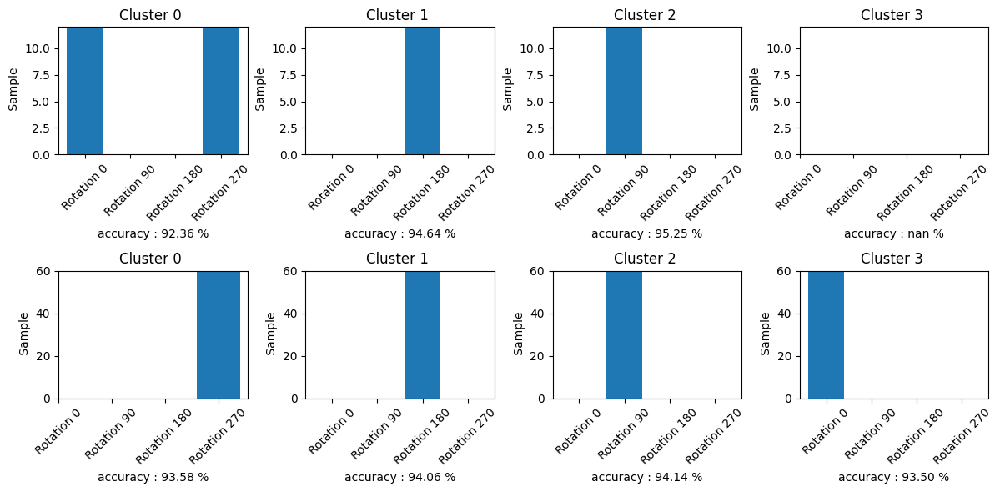

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming your DataFrame is named df
df = client_df

# Add new columns and set values to 0
#new_columns = ['Cluster 2.members_heterogeneity.dilatation', 'Cluster 2.members_heterogeneity.none']
#df = df.assign(**{col: 0 for col in new_columns})

# Selecting the columns of interest for each cluster
columns_of_interest_cluster0 = ['Cluster 0.members_heterogeneity.0', 
                                'Cluster 0.members_heterogeneity.90',
                                'Cluster 0.members_heterogeneity.180','Cluster 0.members_heterogeneity.270']

columns_of_interest_cluster1 = ['Cluster 1.members_heterogeneity.0', 
                                'Cluster 1.members_heterogeneity.90',
                                'Cluster 1.members_heterogeneity.180','Cluster 1.members_heterogeneity.270']

columns_of_interest_cluster2 = ['Cluster 2.members_heterogeneity.0', 
                                'Cluster 2.members_heterogeneity.90',
                                'Cluster 2.members_heterogeneity.180','Cluster 2.members_heterogeneity.270']
columns_of_interest_cluster3 = ['Cluster 3.members_heterogeneity.0', 
                                'Cluster 3.members_heterogeneity.90',
                                'Cluster 3.members_heterogeneity.180','Cluster 3.members_heterogeneity.270']
columns_to_search = columns_of_interest_cluster0+ columns_of_interest_cluster1 +columns_of_interest_cluster2 + columns_of_interest_cluster3
for column in columns_to_search:
    if column not in df.columns:
        df[column] = 0
# Creating subplots
fig, axs = plt.subplots(len(df), len(columns_of_interest_cluster0), figsize=(3*len(columns_of_interest_cluster0), 3*len(df)))

# Plotting bar plots for each row and each cluster
for i, (index, row) in enumerate(df.iterrows()):
    sample_name = row['samples']  # Get the value of 'samples' column for the current row
    max_value = max(row[columns_of_interest_cluster0].max(),
                    row[columns_of_interest_cluster1].max(),
                    row[columns_of_interest_cluster2].max(),row[columns_of_interest_cluster3].max())
    
    for j, columns_of_interest in enumerate([columns_of_interest_cluster0,
                                             columns_of_interest_cluster1,
                                             columns_of_interest_cluster2,columns_of_interest_cluster3]):
        axs[i, j].bar(range(len(columns_of_interest)), row[columns_of_interest], align='center')
        axs[i, j].set_xticks(range(len(columns_of_interest)))
        axs[i, j].set_xticklabels(['Rotation 0', 'Rotation 90', 'Rotation 180', 'Rotation 270'], rotation=45)
        axs[i, j].set_title(f"Cluster {j} ")
        accuracy = row[f'Cluster {j}.accuracy']             
        axs[i, j].set_xlabel(f"accuracy : {accuracy:.2f} %")
        axs[i, j].set_ylabel(f" Sample")
        axs[i, j].set_ylim(0, max_value)  # Set y-axis limits to the maximum value across all clusters

plt.tight_layout()
plt.show()

## Plot T-SNE Client SIDE

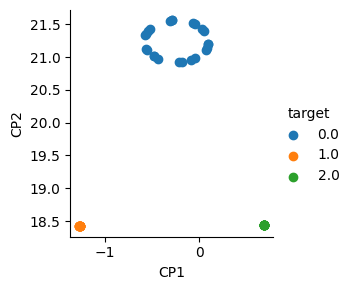

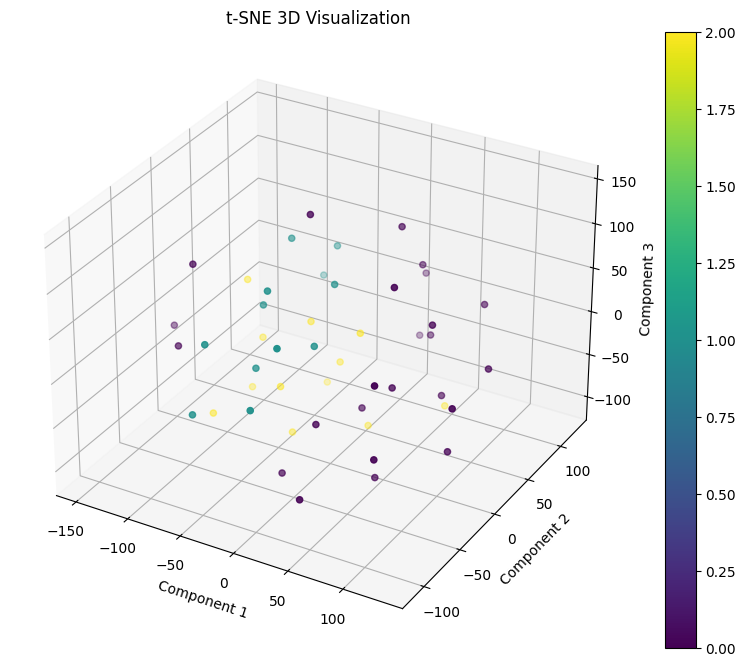

In [17]:
import pickle
import pandas as pd
df = pd.read_pickle('./../results/concept_shift_on_features_client48_client_weights.pkl')
cluster = df['cluster']
df.drop(columns='cluster')
print('')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import sklearn.manifold._t_sne as tsne
X = df
y= cluster
tsne = manifold.TSNE(n_components=2, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
grid = sns.FacetGrid(tsne_df, hue="target")
grid.map(plt.scatter, 'CP1', 'CP2').add_legend()
X = df
y= cluster
tsne = manifold.TSNE(n_components=3, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2','CP3' ,'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot using Matplotlib directly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter = ax.scatter(tsne_df['CP1'], tsne_df['CP2'], tsne_df['CP3'], c=tsne_df['target'], cmap='viridis')

# Set labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE 3D Visualization')

# Add color bar
plt.colorbar(scatter)

plt.show()

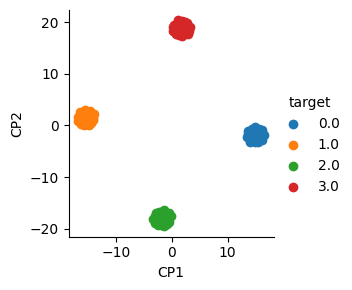

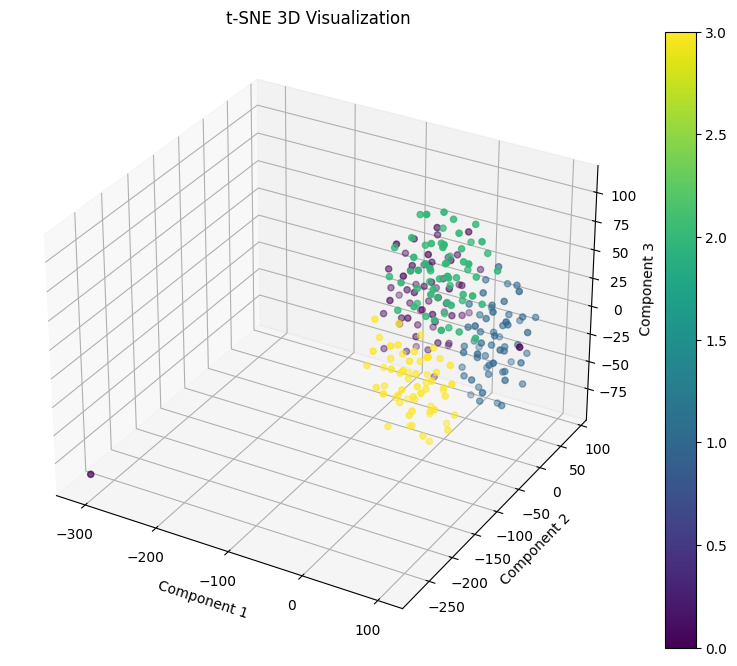

In [18]:
import pickle
import pandas as pd
df = pd.read_pickle('./../results/concept_shift_on_features_client240_client_weights.pkl')
cluster = df['cluster']
df.drop(columns='cluster')
print('')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import sklearn.manifold._t_sne as tsne
X = df
y= cluster
tsne = manifold.TSNE(n_components=2, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
grid = sns.FacetGrid(tsne_df, hue="target")
grid.map(plt.scatter, 'CP1', 'CP2').add_legend()
X = df
y= cluster
tsne = manifold.TSNE(n_components=3, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2','CP3' ,'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot using Matplotlib directly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter = ax.scatter(tsne_df['CP1'], tsne_df['CP2'], tsne_df['CP3'], c=tsne_df['target'], cmap='viridis')

# Set labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE 3D Visualization')

# Add color bar
plt.colorbar(scatter)

plt.show()

## Plot weight heatmap Client SIDE

In [19]:
import torch
import glob
import os

from src.models import SimpleLinear
from src.metrics import plot_weights_heatmap
model = SimpleLinear()

# Define the directories
central_dir = "./results/concept_shift_on_features_central"
client_dir = "./results/concept_shift_on_features_client"
server_dir = "./results/concept_shift_on_features_server"

# Function to load .pth files from a directory into a dictionary
def load_pth_files(directory):
    pth_files = glob.glob(directory + "*.pth")
    models_dict = {}
    for pth_file in pth_files:
        filename = os.path.basename(pth_file)[:-4]  # Remove ".pth" extension
        model = torch.load(pth_file)
        models_dict[filename] = model
    return models_dict

# Load models from each directory
central_models_dict = load_pth_files(central_dir)
client_models_dict = load_pth_files(client_dir)
server_models_dict = load_pth_files(server_dir)

In [24]:
import matplotlib.pyplot as plt
def plot_weights_heatmap(model,title,title2 = '', v_value=0.1 ):
    # Get the weights of the first and second layers
    first_layer_weights = model.fc1.weight.data.numpy()
    second_layer_weights = model.fc2.weight.data.numpy()

    # Create custom colormap
    cmap = 'coolwarm'

    # Plot the input weights of the first layer
    plt.figure(figsize=(5, 3))

    #plt.subplot(2, 1, 1)
    plt.imshow(first_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)
    plt.title(title)
    plt.xlabel('Input Pixel (784)')
    plt.ylabel('Neuron in Hidden Layer (200)')
    plt.colorbar(label='Weight Value')
    plt.tight_layout()
    #plt.savefig(title + '.jpg')  
    plt.show()
'''
    # Plot the output weights of the second layer
    plt.subplot(2, 1, 2)
    plt.imshow(second_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)
    plt.title(title2)
    plt.xlabel('Neuron in Hidden Layer(200)')
    plt.ylabel('Output Neuron (10)')
    plt.colorbar(label='Weight Value')

    plt.tight_layout()
    #plt.savefig(title + '.jpg')  
    plt.show()
    '''

"\n    # Plot the output weights of the second layer\n    plt.subplot(2, 1, 2)\n    plt.imshow(second_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)\n    plt.title(title2)\n    plt.xlabel('Neuron in Hidden Layer(200)')\n    plt.ylabel('Output Neuron (10)')\n    plt.colorbar(label='Weight Value')\n\n    plt.tight_layout()\n    #plt.savefig(title + '.jpg')  \n    plt.show()\n    "

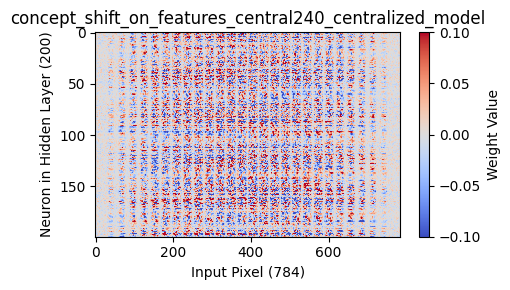

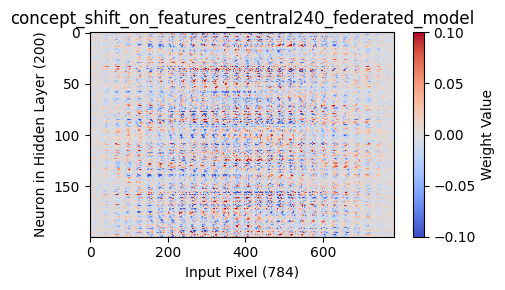

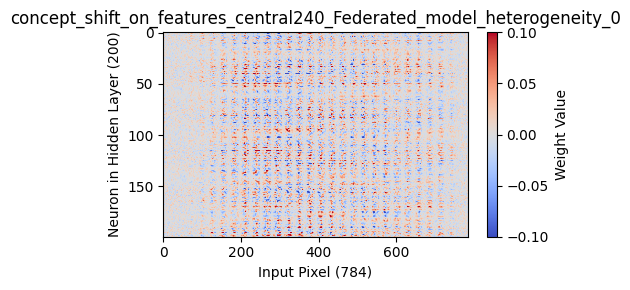

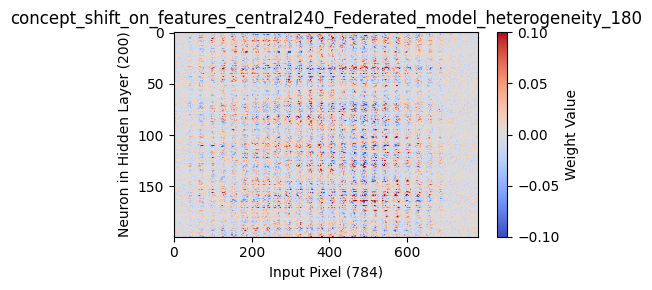

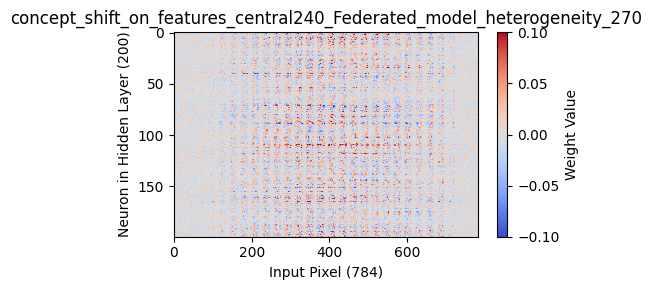

...

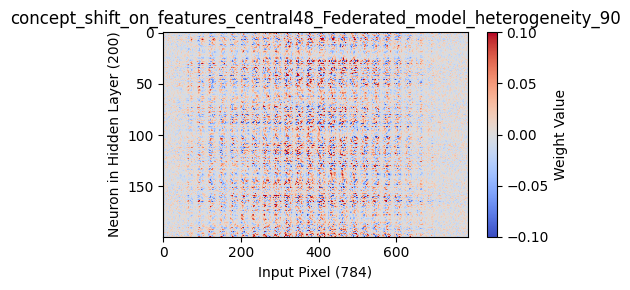

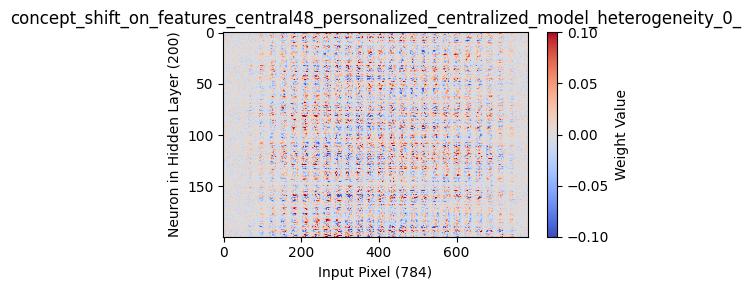

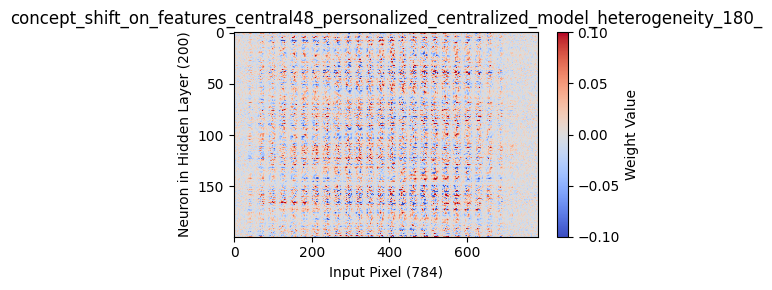

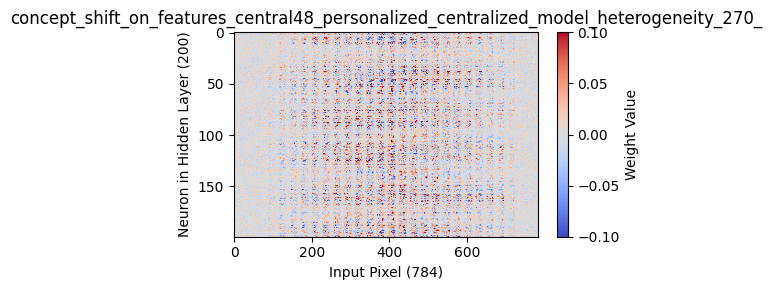

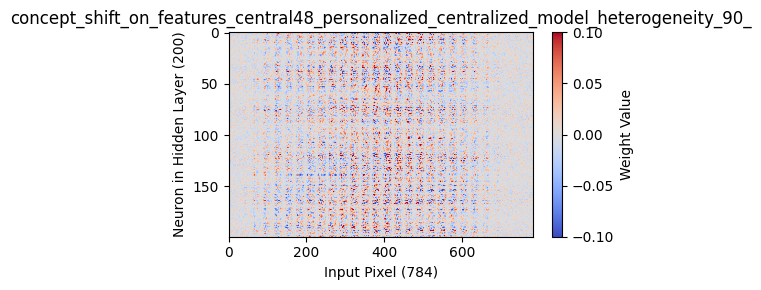

In [27]:
key_list =[]
for key in central_models_dict.keys() :
    key_list.append(key)
for key in key_list :
    model.load_state_dict(central_models_dict[key])
    plot_weights_heatmap(model,key)

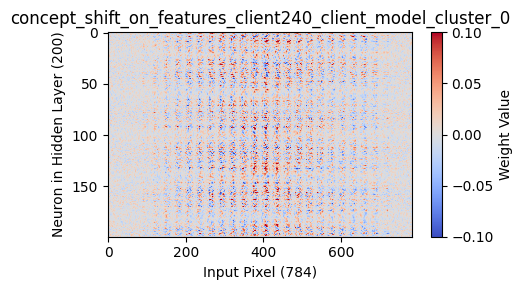

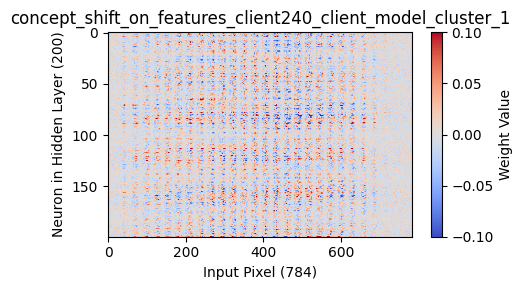

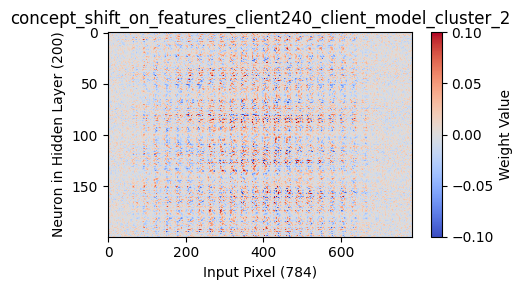

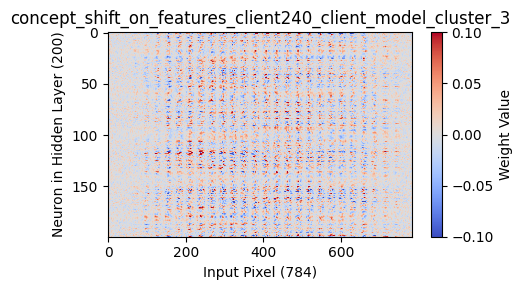

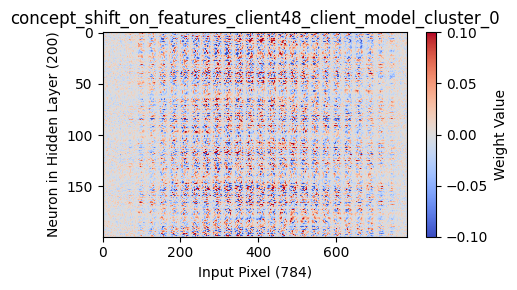

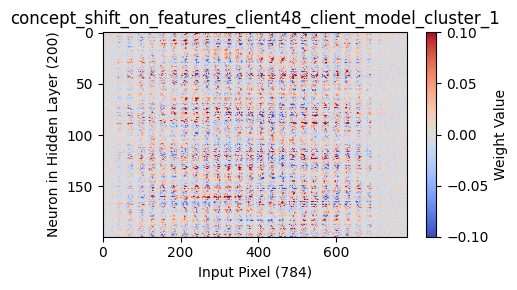

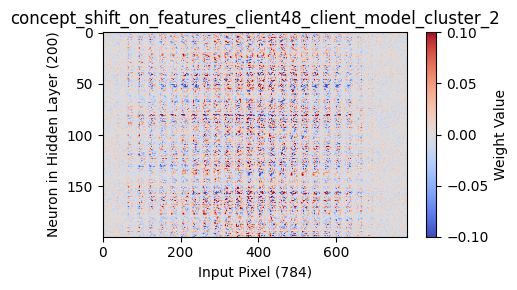

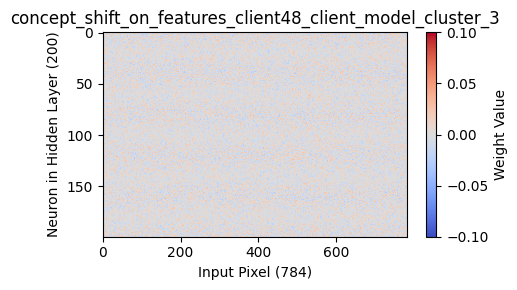

In [28]:
key_list =[]
for key in client_models_dict.keys() :
    key_list.append(key)
for key in key_list :
    model.load_state_dict(client_models_dict[key])
    plot_weights_heatmap(model,key)

# CFL SERVER SIDE

In [12]:
server_df['total'] = server_df['samples']*server_df['clients']
print('SERVERSIDE')
server_df = server_df.sort_values(by=['total','samples'], ascending=True)
display(server_df.transpose())

SERVERSIDE


,0,1
clients,240.000000,48.000000
samples,20.000000,100.000000
cfl_before_cluster_rounds,100.000000,50.000000
cfl_after_cluster_rounds,100.000000,50.000000
cfl_local_epochs,10.000000,50.000000
silhouette,0.950428,0.953293
avg_intra_dist,0.013537,0.020346
duhn_index,12.189350,17.077787
dbi,0.070183,0.062767
Cluster 0.num_members,60.000000,12.000000


In [13]:
from IPython.display import display
server_df = server_df.sort_values(by='clients', ascending=True)
# Select the columns for each DataFrame
display(server_df[['clients','samples','silhouette',	'avg_intra_dist',	'duhn_index', 'dbi']])
# Create new DataFrames
cluster_columns = [col for col in server_df.columns if col.startswith('Cluster')]
cluster_dfs = {}
for i in range(4):  # Assuming you want to create 4 new DataFrames
    cluster_dfs[i] = server_df[['clients', 'samples'] + [col for col in cluster_columns if col.startswith(f'Cluster {i}')]]
    display(cluster_dfs[i].transpose())

,clients,samples,silhouette,avg_intra_dist,duhn_index,dbi
1,48,100,0.953293,0.020346,17.077787,0.062767
0,240,20,0.950428,0.013537,12.189350,0.070183


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 0.num_members,12.000000,60.000000
Cluster 0.accuracy,95.666667,94.861111
Cluster 0.std,0.623610,2.551174
Cluster 0.members_heterogeneity.90,12.000000,60.000000


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 1.num_members,12.000000,60.000000
Cluster 1.accuracy,95.583333,94.333333
Cluster 1.std,0.944036,3.061106
Cluster 1.members_heterogeneity.180,12.000000,60.000000


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 2.num_members,12.000000,60.000000
Cluster 2.accuracy,95.861111,94.083333
Cluster 2.std,1.125943,3.018845
Cluster 2.members_heterogeneity.0,12.000000,60.000000


,1,0
clients,48.000000,240.000000
samples,100.000000,20.000000
Cluster 3.num_members,12.000000,60.000000
Cluster 3.accuracy,95.611111,92.972222
Cluster 3.std,0.664348,3.278602
Cluster 3.members_heterogeneity.270,12.000000,60.000000


In [15]:
server_df

,clients,samples,cfl_before_cluster_rounds,cfl_after_cluster_rounds,cfl_local_epochs,silhouette,avg_intra_dist,duhn_index,dbi,Cluster 0.num_members,...,Cluster 1.members_heterogeneity.180,Cluster 2.num_members,Cluster 2.accuracy,Cluster 2.std,Cluster 2.members_heterogeneity.0,Cluster 3.num_members,Cluster 3.accuracy,Cluster 3.std,Cluster 3.members_heterogeneity.270,total
1,48,100,50,50,50,0.953293,0.020346,17.077787,0.062767,12,...,12,12,95.861111,1.125943,12,12,95.611111,0.664348,12,4800
0,240,20,100,100,10,0.950428,0.013537,12.189350,0.070183,60,...,60,60,94.083333,3.018845,60,60,92.972222,3.278602,60,4800


In [14]:
display(server_df[['Cluster 0.accuracy','Cluster 1.accuracy','Cluster 2.accuracy','Cluster 3.accuracy']].mean(axis=1))
server_df[['Cluster 0.accuracy','Cluster 1.accuracy','Cluster 2.accuracy','Cluster 3.accuracy']].std(axis=1)

1    95.680556
0    94.062500
dtype: float64

1    0.125257
0    0.795879
dtype: float64

## Histogram Server SIDE

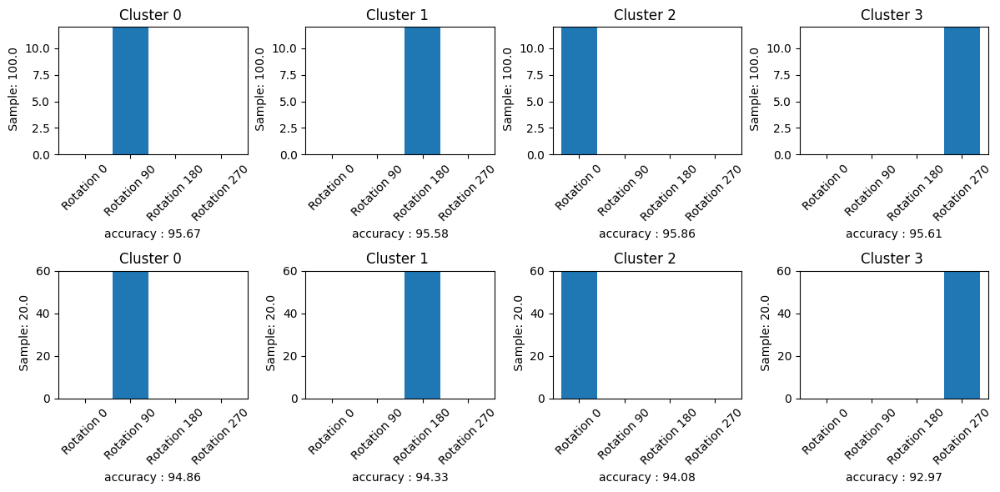

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming your DataFrame is named df
df = server_df

# Add new columns and set values to 0
#new_columns = ['Cluster 2.members_heterogeneity.dilatation', 'Cluster 2.members_heterogeneity.none']
#df = df.assign(**{col: 0 for col in new_columns})

# Selecting the columns of interest for each cluster
columns_of_interest_cluster0 = ['Cluster 0.members_heterogeneity.0', 
                                'Cluster 0.members_heterogeneity.90',
                                'Cluster 0.members_heterogeneity.180','Cluster 0.members_heterogeneity.270']

columns_of_interest_cluster1 = ['Cluster 1.members_heterogeneity.0', 
                                'Cluster 1.members_heterogeneity.90',
                                'Cluster 1.members_heterogeneity.180','Cluster 1.members_heterogeneity.270']

columns_of_interest_cluster2 = ['Cluster 2.members_heterogeneity.0', 
                                'Cluster 2.members_heterogeneity.90',
                                'Cluster 2.members_heterogeneity.180','Cluster 2.members_heterogeneity.270']
columns_of_interest_cluster3 = ['Cluster 3.members_heterogeneity.0', 
                                'Cluster 3.members_heterogeneity.90',
                                'Cluster 3.members_heterogeneity.180','Cluster 3.members_heterogeneity.270']
columns_to_search = columns_of_interest_cluster0+ columns_of_interest_cluster1 +columns_of_interest_cluster2 + columns_of_interest_cluster3
for column in columns_to_search:
    if column not in df.columns:
        df[column] = 0
# Creating subplots
fig, axs = plt.subplots(len(df), len(columns_of_interest_cluster0), figsize=(3*len(columns_of_interest_cluster0), 3*len(df)))

# Plotting bar plots for each row and each cluster
for i, (index, row) in enumerate(df.iterrows()):
    sample_name = row['samples']  # Get the value of 'samples' column for the current row
    max_value = max(row[columns_of_interest_cluster0].max(),
                    row[columns_of_interest_cluster1].max(),
                    row[columns_of_interest_cluster2].max(),row[columns_of_interest_cluster3].max())
    
    for j, columns_of_interest in enumerate([columns_of_interest_cluster0,
                                             columns_of_interest_cluster1,
                                             columns_of_interest_cluster2,columns_of_interest_cluster3]):
        axs[i, j].bar(range(len(columns_of_interest)), row[columns_of_interest], align='center')
        axs[i, j].set_xticks(range(len(columns_of_interest)))
        axs[i, j].set_xticklabels(['Rotation 0', 'Rotation 90', 'Rotation 180', 'Rotation 270'], rotation=45)
        axs[i, j].set_title(f"Cluster {j} ")
        accuracy = row[f'Cluster {j}.accuracy']
        axs[i, j].set_xlabel(f"accuracy : {accuracy:.2f}")
        axs[i, j].set_ylabel(f" Sample")
        axs[i, j].set_ylim(0, max_value)  # Set y-axis limits to the maximum value across all clusters

plt.tight_layout()
plt.show()

## Plot T-SNE Server SIDE

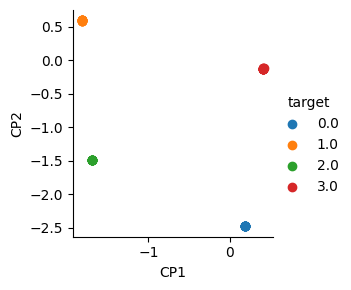

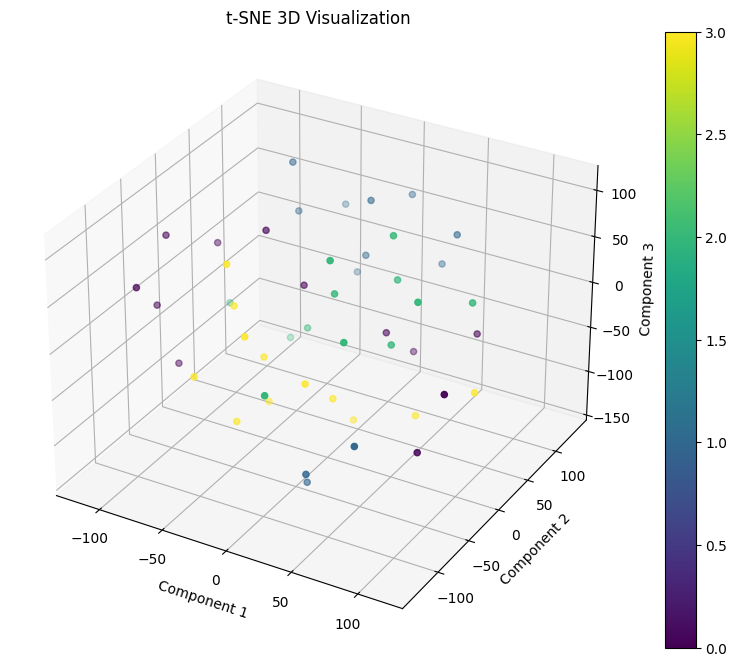

In [23]:
import pickle
import pandas as pd
df = pd.read_pickle('./../results/concept_shift_on_features_server48_client_weights.pkl')
cluster = df['cluster']
df.drop(columns='cluster')
print('')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import sklearn.manifold._t_sne as tsne
X = df
y= cluster
tsne = manifold.TSNE(n_components=2, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
grid = sns.FacetGrid(tsne_df, hue="target")
grid.map(plt.scatter, 'CP1', 'CP2').add_legend()
X = df
y= cluster
tsne = manifold.TSNE(n_components=3, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2','CP3' ,'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot using Matplotlib directly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter = ax.scatter(tsne_df['CP1'], tsne_df['CP2'], tsne_df['CP3'], c=tsne_df['target'], cmap='viridis')

# Set labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE 3D Visualization')

# Add color bar
plt.colorbar(scatter)

plt.show()

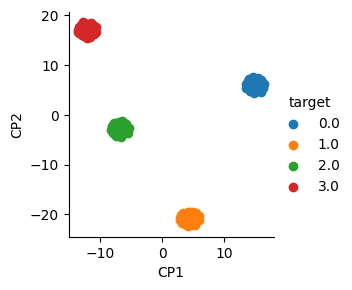

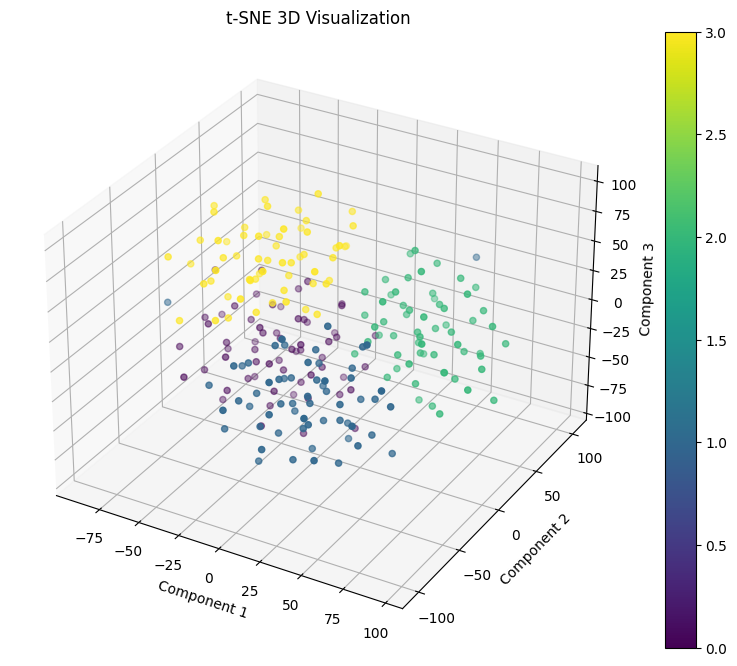

In [24]:
import pickle
import pandas as pd
df = pd.read_pickle('./../results/concept_shift_on_features_server240_client_weights.pkl')
cluster = df['cluster']
df.drop(columns='cluster')
print('')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import sklearn.manifold._t_sne as tsne
X = df
y= cluster
tsne = manifold.TSNE(n_components=2, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
grid = sns.FacetGrid(tsne_df, hue="target")
grid.map(plt.scatter, 'CP1', 'CP2').add_legend()
X = df
y= cluster
tsne = manifold.TSNE(n_components=3, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2','CP3' ,'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot using Matplotlib directly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter = ax.scatter(tsne_df['CP1'], tsne_df['CP2'], tsne_df['CP3'], c=tsne_df['target'], cmap='viridis')

# Set labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE 3D Visualization')

# Add color bar
plt.colorbar(scatter)

plt.show()

## Plot weight heatmap server SIDE

In [26]:
import torch
import glob
import os

from src.models import SimpleLinear
from src.metrics import plot_weights_heatmap
model = SimpleLinear()

# Define the directories
central_dir = "./results/concept_shift_on_features_central"
client_dir = "./results/concept_shift_on_features_client"
server_dir = "./results/concept_shift_on_features_server"

# Function to load .pth files from a directory into a dictionary
def load_pth_files(directory):
    pth_files = glob.glob(directory + "*.pth")
    models_dict = {}
    for pth_file in pth_files:
        filename = os.path.basename(pth_file)[:-4]  # Remove ".pth" extension
        model = torch.load(pth_file)
        models_dict[filename] = model
    return models_dict

# Load models from each directory
central_models_dict = load_pth_files(central_dir)
client_models_dict = load_pth_files(client_dir)
server_models_dict = load_pth_files(server_dir)

In [27]:
import matplotlib.pyplot as plt
def plot_weights_heatmap(model,title,title2 = '', v_value=0.1 ):
    # Get the weights of the first and second layers
    first_layer_weights = model.fc1.weight.data.numpy()
    second_layer_weights = model.fc2.weight.data.numpy()

    # Create custom colormap
    cmap = 'coolwarm'

    # Plot the input weights of the first layer
    plt.figure(figsize=(5, 3))

    #plt.subplot(2, 1, 1)
    plt.imshow(first_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)
    plt.title(title)
    plt.xlabel('Input Pixel (784)')
    plt.ylabel('Neuron in Hidden Layer (200)')
    plt.colorbar(label='Weight Value')
    plt.tight_layout()
    #plt.savefig(title + '.jpg')  
    plt.show()
'''
    # Plot the output weights of the second layer
    plt.subplot(2, 1, 2)
    plt.imshow(second_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)
    plt.title(title2)
    plt.xlabel('Neuron in Hidden Layer(200)')
    plt.ylabel('Output Neuron (10)')
    plt.colorbar(label='Weight Value')

    plt.tight_layout()
    #plt.savefig(title + '.jpg')  
    plt.show()
    '''

"\n    # Plot the output weights of the second layer\n    plt.subplot(2, 1, 2)\n    plt.imshow(second_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)\n    plt.title(title2)\n    plt.xlabel('Neuron in Hidden Layer(200)')\n    plt.ylabel('Output Neuron (10)')\n    plt.colorbar(label='Weight Value')\n\n    plt.tight_layout()\n    #plt.savefig(title + '.jpg')  \n    plt.show()\n    "

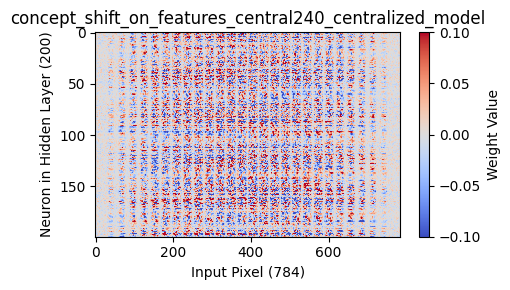

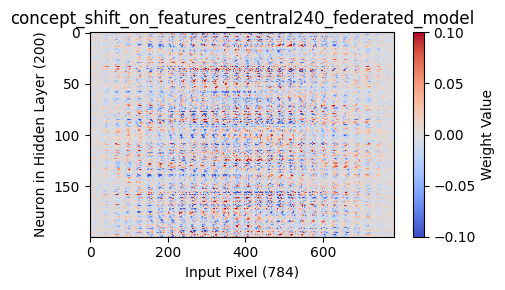

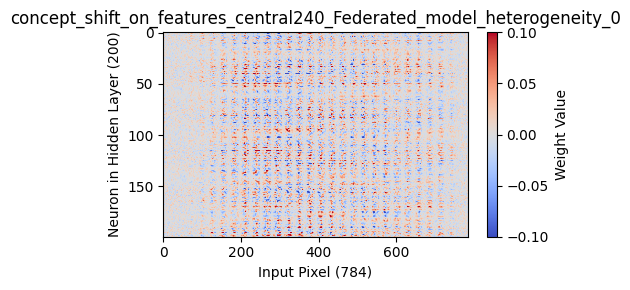

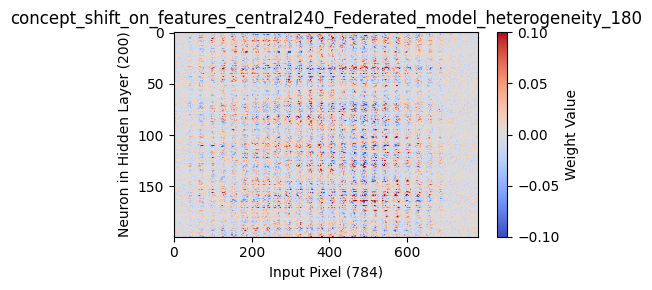

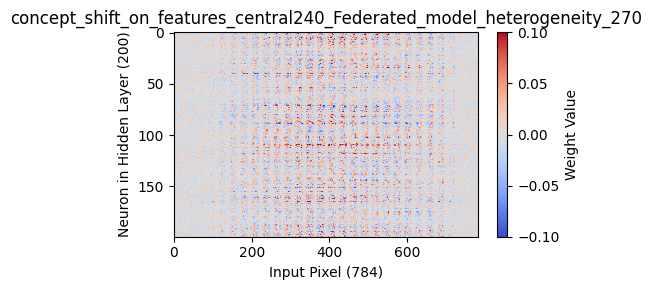

...

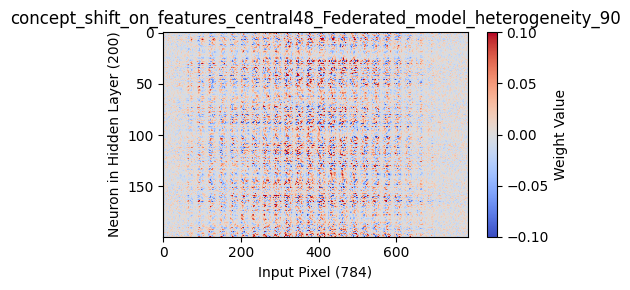

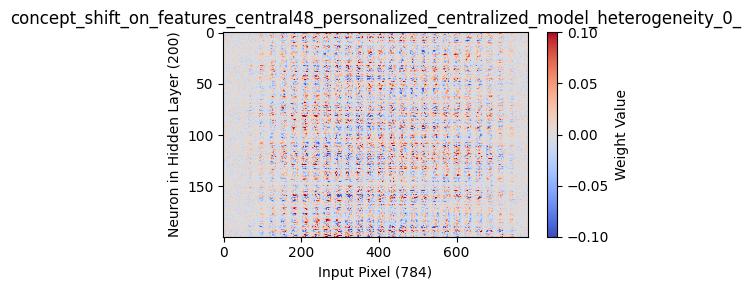

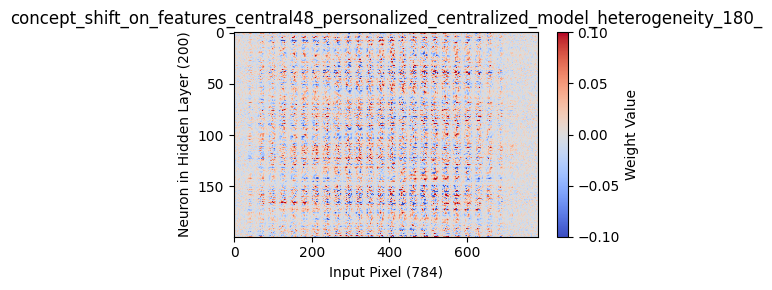

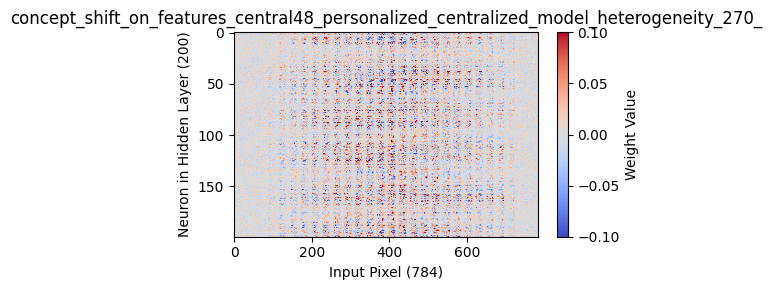

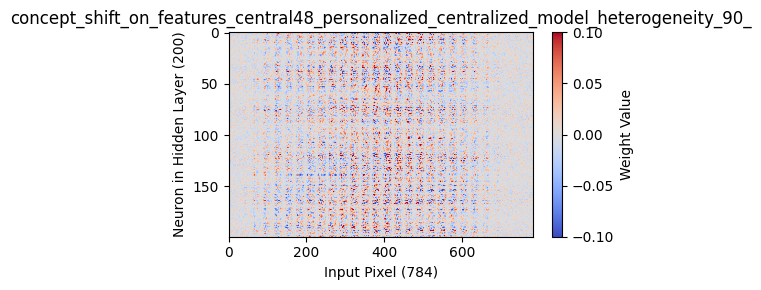

In [28]:
key_list =[]
for key in central_models_dict.keys() :
    key_list.append(key)
for key in key_list :
    model.load_state_dict(central_models_dict[key])
    plot_weights_heatmap(model,key)

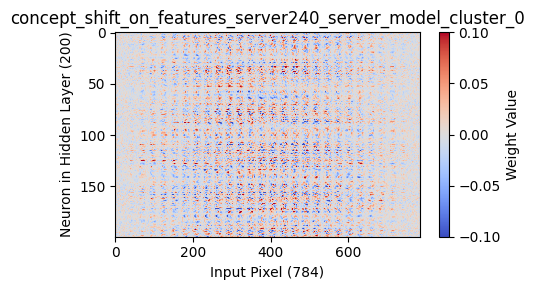

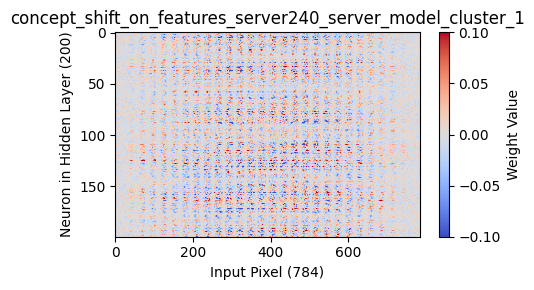

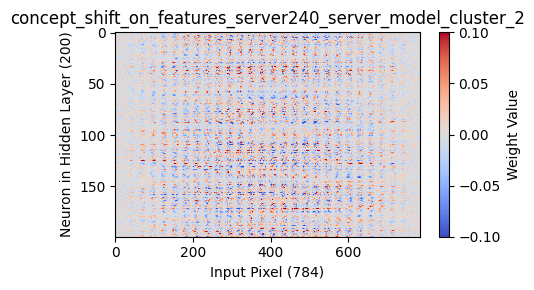

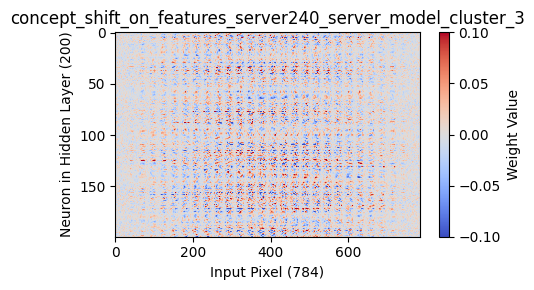

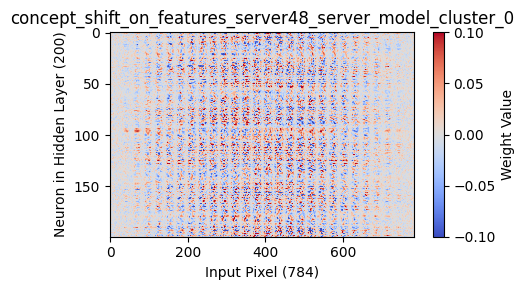

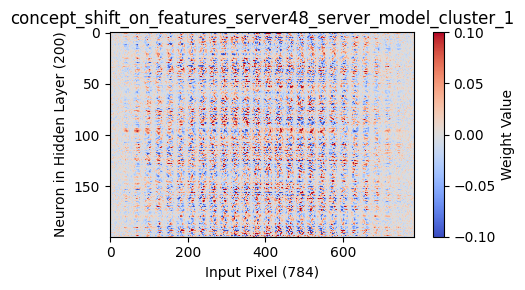

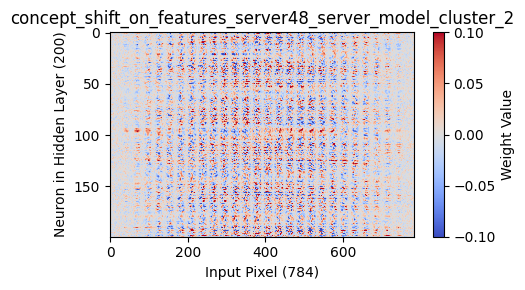

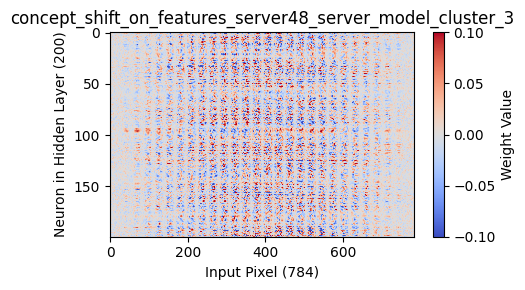

In [30]:
key_list =[]
for key in server_models_dict.keys() :
    key_list.append(key)
for key in key_list :
    model.load_state_dict(server_models_dict[key])
    plot_weights_heatmap(model,key)

# Similarity Matrix

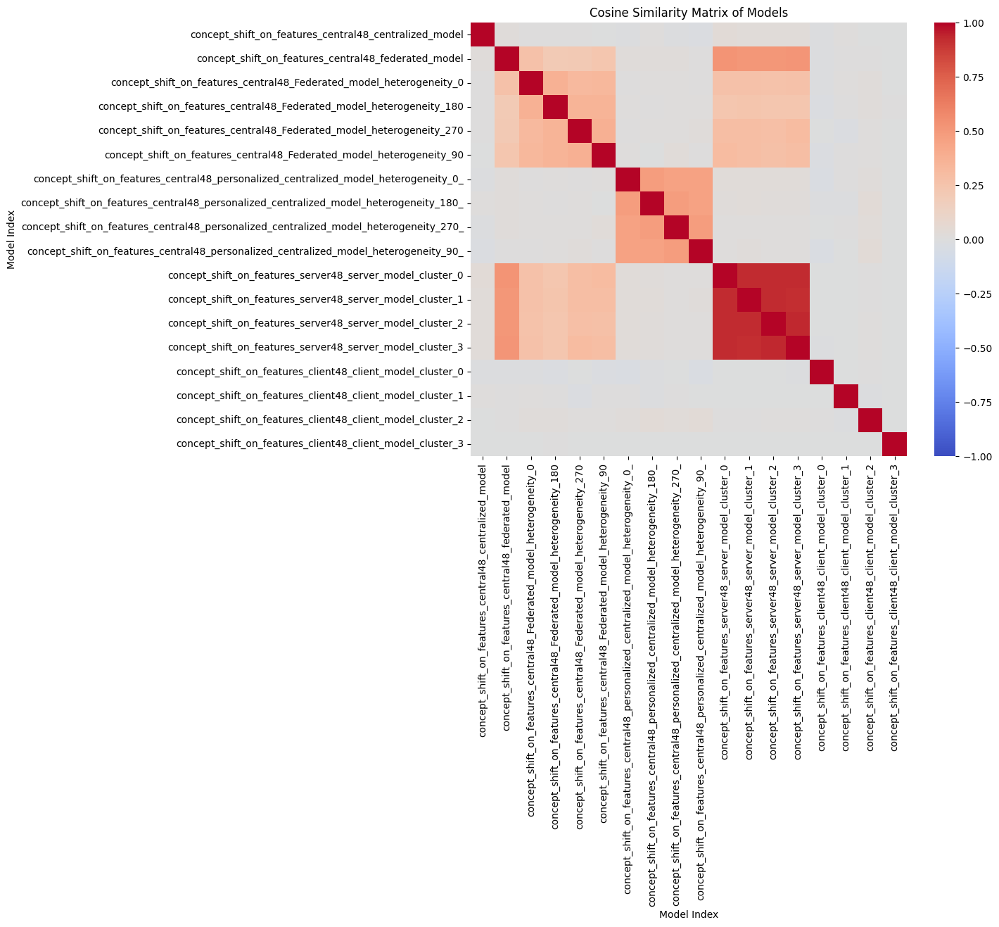

In [1]:
import torch
import glob
import os

from src.models import SimpleLinear
from src.metrics import plot_weights_heatmap
model = SimpleLinear()

# Define the directories
central_dir = "./results/concept_shift_on_features_central48"
client_dir = "./results/concept_shift_on_features_client48"
server_dir = "./results/concept_shift_on_features_server48"

# Function to load .pth files from a directory into a dictionary
def load_pth_files(directory):
    pth_files = glob.glob(directory + "*.pth")
    models_dict = {}
    for pth_file in pth_files:
        filename = os.path.basename(pth_file)[:-4]  # Remove ".pth" extension
        model = torch.load(pth_file)
        models_dict[filename] = model
    return models_dict

# Load models from each directory
central_models_dict = load_pth_files(central_dir)
client_models_dict = load_pth_files(client_dir)
server_models_dict = load_pth_files(server_dir)
import torch
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt
key_list =[]
for key in central_models_dict.keys() :
  key_list.append(key)
for key in server_models_dict.keys() :
  key_list.append(key)
for key in client_models_dict.keys() :
  key_list.append(key)
# Load all the models using their state dicts
concatenated_dict = {}

concatenated_dict.update(central_models_dict)
concatenated_dict.update(server_models_dict)
concatenated_dict.update(client_models_dict)
models = []
for key in key_list:
    model = model = SimpleLinear()
  # Instantiate your PyTorch model
    model.load_state_dict(concatenated_dict[key])
    models.append(model)

# Extract parameters and flatten them
parameters = [torch.cat([param.view(-1) for param in model.parameters()]) for model in models]

# Compute cosine similarity matrix
cos_sim_matrix = cosine_similarity(torch.stack(parameters).detach().numpy())

# Plot heatmap with labels but without annotations
plt.figure(figsize=(10, 8))
sns.heatmap(cos_sim_matrix, cmap='coolwarm', center=0, xticklabels=key_list, yticklabels=key_list, annot=False, vmin=-1, vmax=1)
plt.title('Cosine Similarity Matrix of Models')
plt.xlabel('Model Index')
plt.ylabel('Model Index')
plt.show()

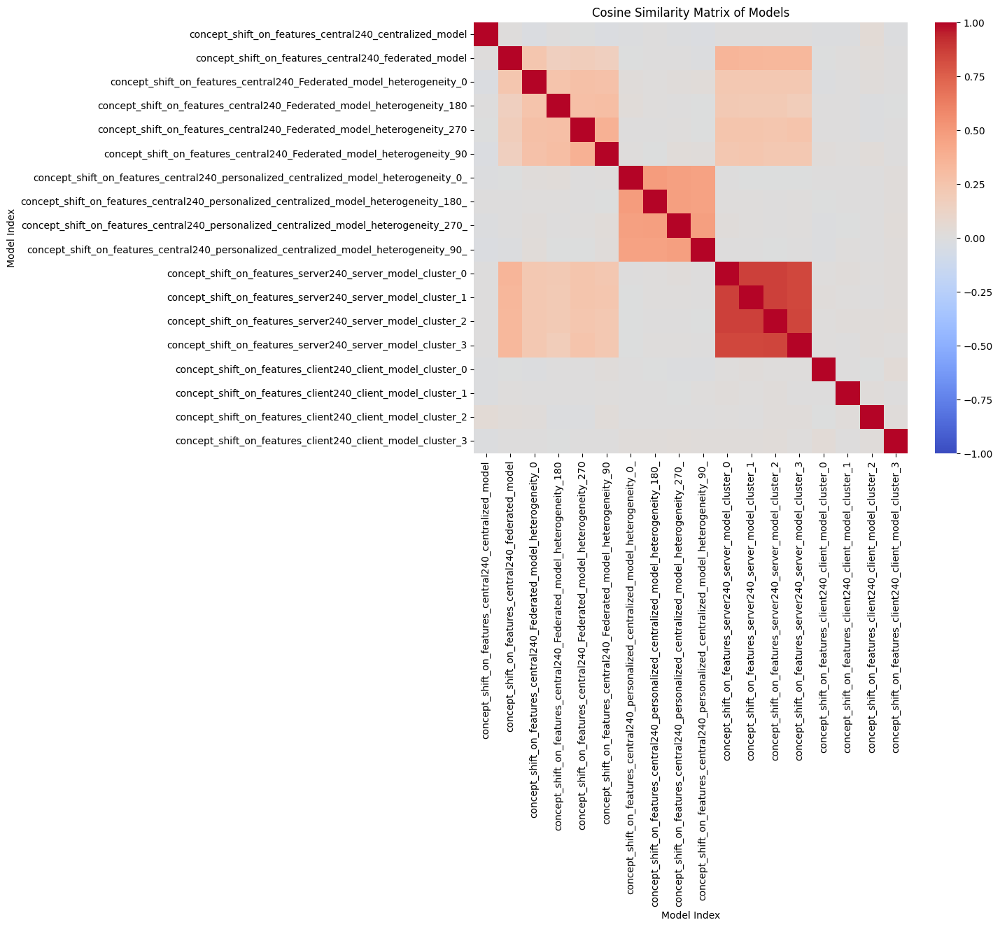

In [2]:
import torch
import glob
import os

from src.models import SimpleLinear
from src.metrics import plot_weights_heatmap
model = SimpleLinear()

# Define the directories
central_dir = "./results/concept_shift_on_features_central240"
client_dir = "./results/concept_shift_on_features_client240"
server_dir = "./results/concept_shift_on_features_server240"

# Function to load .pth files from a directory into a dictionary
def load_pth_files(directory):
    pth_files = glob.glob(directory + "*.pth")
    models_dict = {}
    for pth_file in pth_files:
        filename = os.path.basename(pth_file)[:-4]  # Remove ".pth" extension
        model = torch.load(pth_file)
        models_dict[filename] = model
    return models_dict

# Load models from each directory
central_models_dict = load_pth_files(central_dir)
client_models_dict = load_pth_files(client_dir)
server_models_dict = load_pth_files(server_dir)
import torch
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt
key_list =[]
for key in central_models_dict.keys() :
  key_list.append(key)
for key in server_models_dict.keys() :
  key_list.append(key)
for key in client_models_dict.keys() :
  key_list.append(key)
# Load all the models using their state dicts
concatenated_dict = {}

concatenated_dict.update(central_models_dict)
concatenated_dict.update(server_models_dict)
concatenated_dict.update(client_models_dict)
models = []
for key in key_list:
    model = model = SimpleLinear()
  # Instantiate your PyTorch model
    model.load_state_dict(concatenated_dict[key])
    models.append(model)

# Extract parameters and flatten them
parameters = [torch.cat([param.view(-1) for param in model.parameters()]) for model in models]

# Compute cosine similarity matrix
cos_sim_matrix = cosine_similarity(torch.stack(parameters).detach().numpy())

# Plot heatmap with labels but without annotations
plt.figure(figsize=(10, 8))
sns.heatmap(cos_sim_matrix, cmap='coolwarm', center=0, xticklabels=key_list, yticklabels=key_list, annot=False, vmin=-1, vmax=1)
plt.title('Cosine Similarity Matrix of Models')
plt.xlabel('Model Index')
plt.ylabel('Model Index')
plt.show()